<a href="https://colab.research.google.com/github/SebastianWikt/DS4002-P3/blob/main/Scripts/DS4002P3MovieAnalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# !rm -r DS4002-P3/

In [1]:
! git clone https://github.com/SebastianWikt/DS4002-P3.git

Cloning into 'DS4002-P3'...
remote: Enumerating objects: 47, done.
remote: Counting objects: 100% (47/47), done.
remote: Compressing objects: 100% (41/41), done.
remote: Total 47 (delta 18), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (47/47), 12.47 MiB | 5.80 MiB/s, done.
Resolving deltas: 100% (18/18), done.


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2

def loadData(file):
  # The column names are adopted from the dataset page on Kaggle
  df = pd.read_csv(file)
  return df

def plot_color_histograms(image_paths):
    for img_path in image_paths:
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        colors = ('r', 'g', 'b')
        plt.figure(figsize=(10, 5))
        plt.title(f'Color Histogram for {os.path.basename(img_path)}')

        for i, color in enumerate(colors):
            hist = cv2.calcHist([img], [i], None, [256], [0, 256])
            plt.plot(hist, color=color)
            plt.xlim([0, 256])
        plt.xlabel('Pixel Intensity')
        plt.ylabel('Frequency')
        plt.show()

def check_color_channels(image_paths):
    for img_path in image_paths:
        img = cv2.imread(img_path)
        if len(img.shape) == 2:  # Grayscale images have 2 dimensions
            print(f'{os.path.basename(img_path)} is Grayscale')
        elif len(img.shape) == 3 and img.shape[2] == 3:  # RGB images have 3 dimensions
            print(f'{os.path.basename(img_path)} is RGB')
        else:
            print(f'{os.path.basename(img_path)} has an unusual format')

def check_image_quality(image_paths, min_resolution=(150, 150)):
    for img_path in image_paths:
        img = cv2.imread(img_path)
        # Check resolution
        height, width = img.shape[:2]
        if width < min_resolution[0] or height < min_resolution[1]:
            print(f'Low-resolution image: {os.path.basename(img_path)} - {width}x{height} pixels')

        # Check brightness (mean of pixel intensities)
        brightness = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).mean()
        print(f'{os.path.basename(img_path)} - Mean Brightness: {brightness:.2f}')

        # Check blur using Laplacian variance
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()
        if laplacian_var < 100:  # Threshold for blur detection (adjust as needed)
            print(f'Blurred image: {os.path.basename(img_path)} - Variance: {laplacian_var:.2f}')

In [3]:
df = pd.read_csv('/content/DS4002-P3/Data/MoviePosterData.csv')
genre_horror = df[df['Genre'] == 'Horror']
genre_romance = df[df['Genre'] == 'Romance']
genre_comedy = df[df['Genre'] == 'Comedy']

In [18]:
import os
import requests
from PIL import Image, ImageStat
from io import BytesIO
import numpy as np
import cv2

folder_path = '/content/images'
os.makedirs(folder_path, exist_ok=True)

for i, url in enumerate(df['MoviePoster']):
    try:
        response = requests.get(url)
        image = Image.open(BytesIO(response.content))
        image.save(os.path.join(folder_path, f"image_{i}.jpg"))
        print(f"Saved image_{i}.jpg")
    except Exception as e:
        print(f"Failed to download {url}: {e}")

Saved image_0.jpg
Saved image_1.jpg
Saved image_2.jpg
Saved image_3.jpg
Saved image_4.jpg
Saved image_5.jpg
Saved image_6.jpg
Saved image_7.jpg
Saved image_8.jpg
Saved image_9.jpg
Saved image_10.jpg
Saved image_11.jpg
Saved image_12.jpg
Saved image_13.jpg
Saved image_14.jpg
Saved image_15.jpg
Saved image_16.jpg
Saved image_17.jpg
Saved image_18.jpg
Saved image_19.jpg
Saved image_20.jpg
Saved image_21.jpg
Saved image_22.jpg
Saved image_23.jpg
Saved image_24.jpg
Saved image_25.jpg
Saved image_26.jpg
Saved image_27.jpg
Saved image_28.jpg
Saved image_29.jpg
Saved image_30.jpg
Saved image_31.jpg
Saved image_32.jpg
Saved image_33.jpg
Saved image_34.jpg
Saved image_35.jpg
Saved image_36.jpg
Saved image_37.jpg
Saved image_38.jpg
Saved image_39.jpg
Saved image_40.jpg
Saved image_41.jpg
Saved image_42.jpg
Saved image_43.jpg
Saved image_44.jpg
Saved image_45.jpg
Saved image_46.jpg
Saved image_47.jpg
Saved image_48.jpg
Saved image_49.jpg
Saved image_50.jpg
Saved image_51.jpg
Saved image_52.jpg
Sav

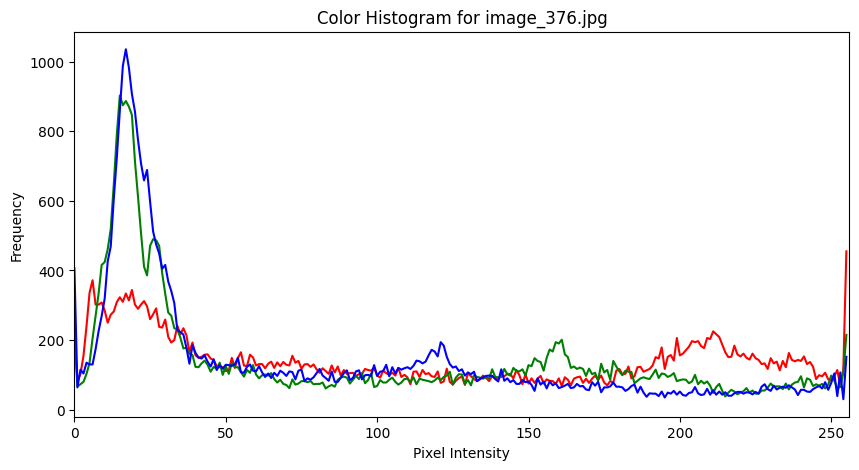

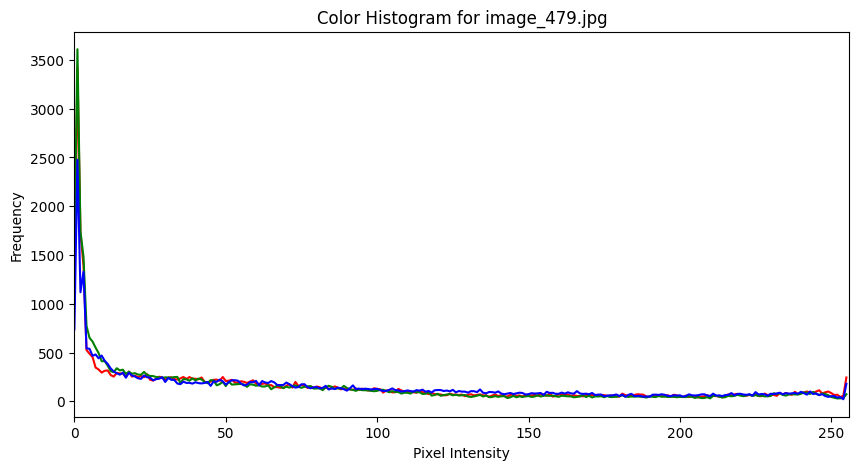

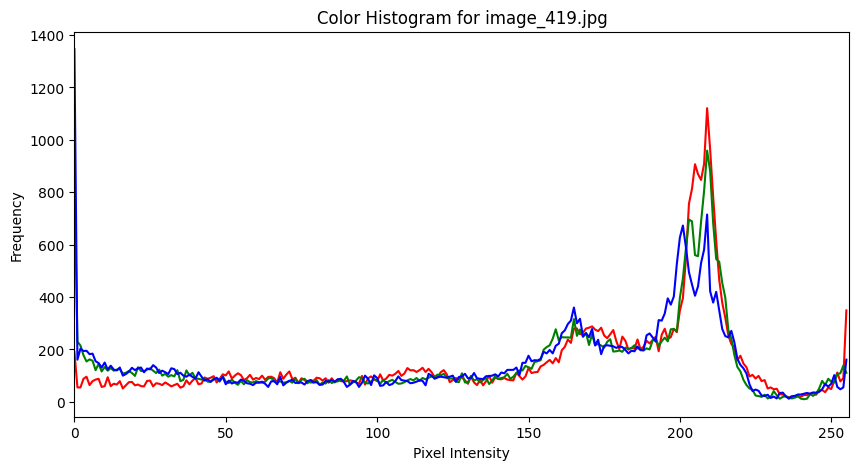

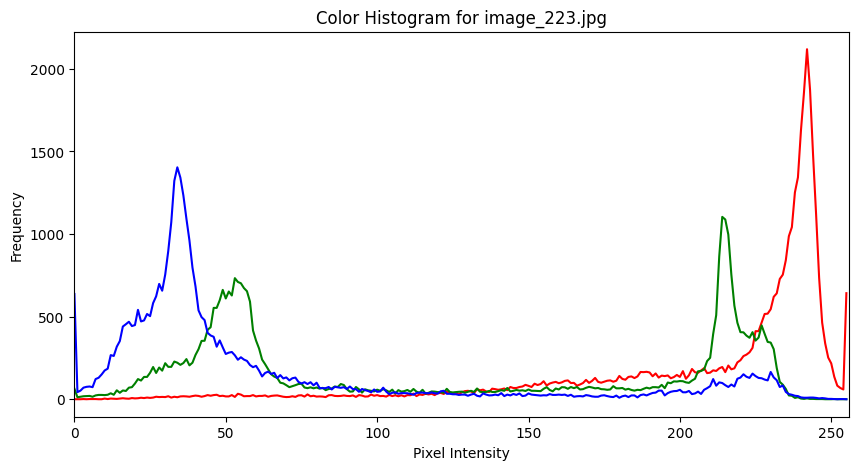

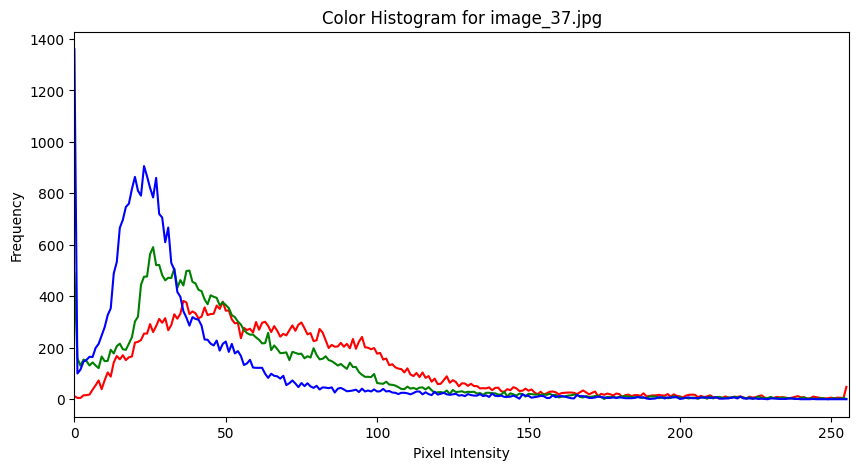

...

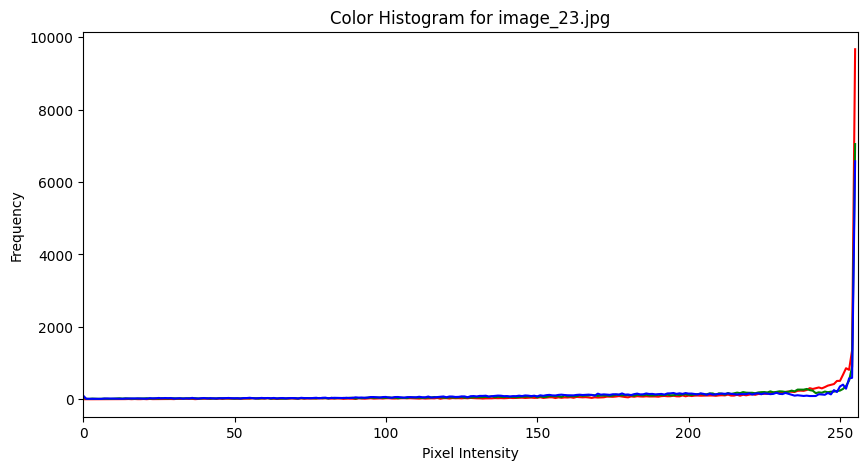

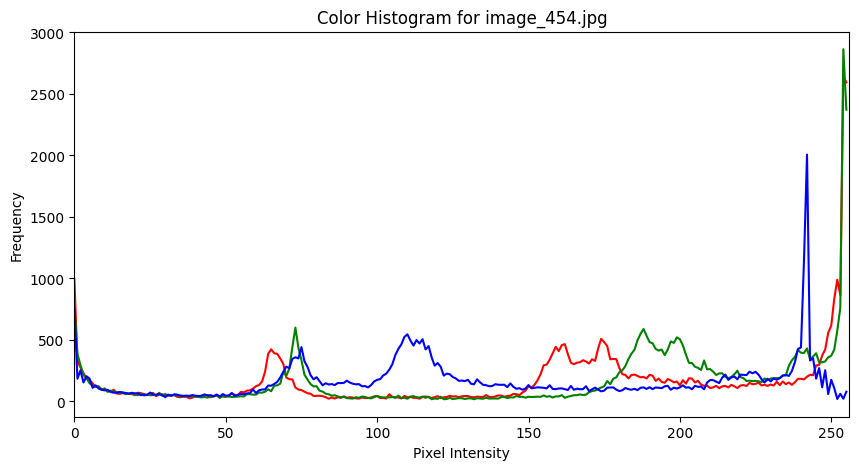

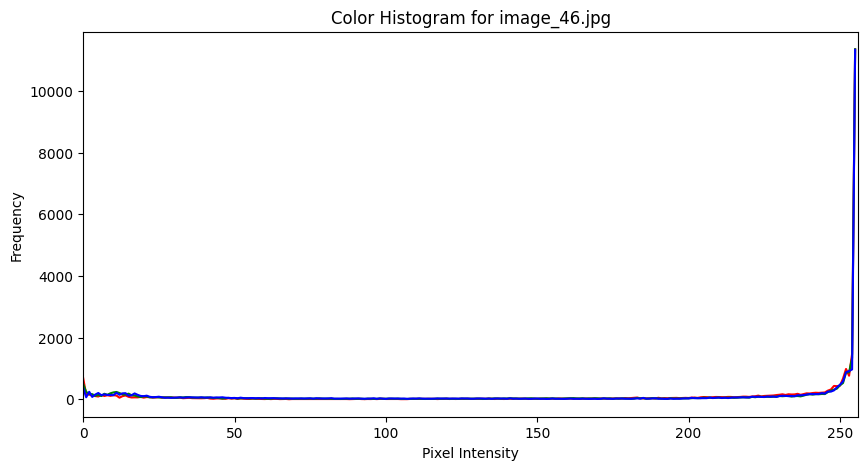

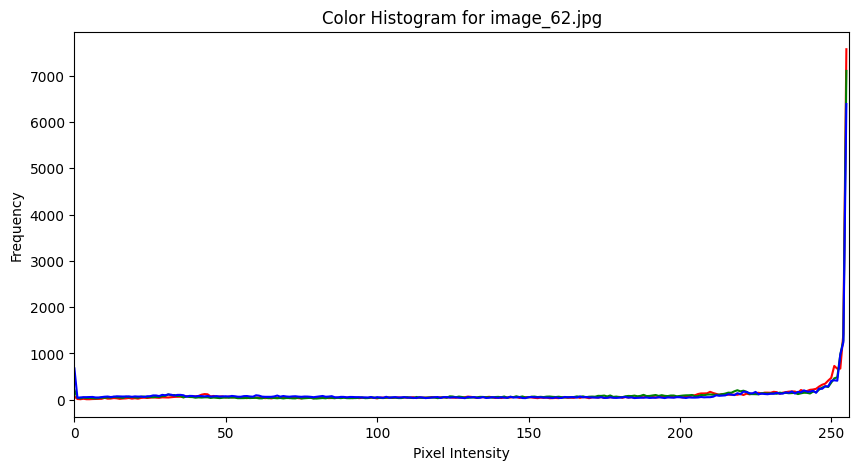

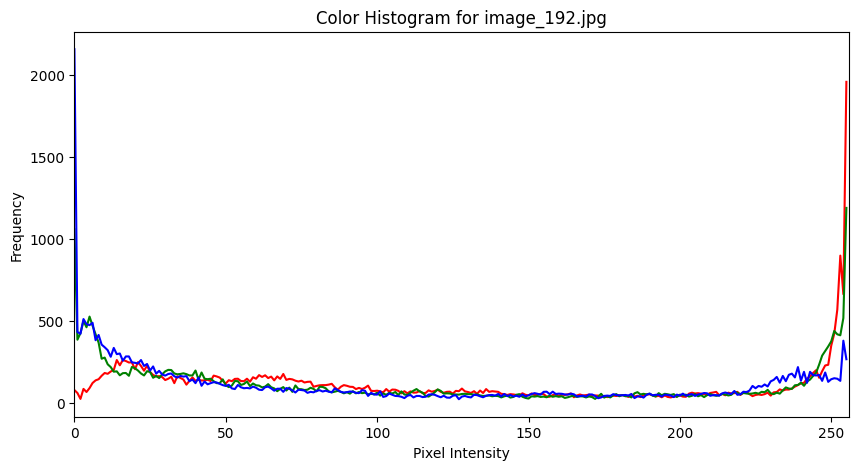

In [ ]:
image_folder = folder_path
image_paths = [os.path.join(image_folder, img) for img in os.listdir(image_folder)]
plot_color_histograms(image_paths)

In [39]:
# Calculating average image r,g,b and adding to dataframe
rgb_values = []
for i in range(550):
    if i == 444 or i == 496:
      rgb_values.append(np.NaN)
    else:
      img = Image.open(f'/content/images/image_{i}.jpg')
      img = img.convert('RGB')  # Ensure image is in RGB format
      img_array = np.array(img)
      rgb_values.append(img_array.mean(axis=(0, 1)))  # Calculate mean RGB values for each image
      df.loc[i, 'avg_r'] = rgb_values[i][0]
      df.loc[i, 'avg_g'] = rgb_values[i][1]
      df.loc[i, 'avg_b'] = rgb_values[i][2]

df.head()

,Genre,MoviePoster,Movie Title,brightness,avg_r,avg_g,avg_b
0,Romance,https://m.media-amazon.com/images/M/MV5BYjA4MT...,Malena,131.847930,177.146273,121.351518,67.048033
1,Romance,https://m.media-amazon.com/images/M/MV5BOTNmYz...,Amélie,59.359317,48.843409,67.795859,43.635128
2,Romance,https://m.media-amazon.com/images/M/MV5BYTY3Mm...,A Very Long Engagement,99.831504,141.257937,88.041304,51.757971
3,Romance,https://m.media-amazon.com/images/M/MV5BN2Q4Nj...,In the Mood for Love,64.327985,95.578675,54.588302,32.591339
4,Romance,https://m.media-amazon.com/images/M/MV5BYjIyND...,The Curious Case of Benjamin Button,84.113768,96.813975,81.418979,64.714148


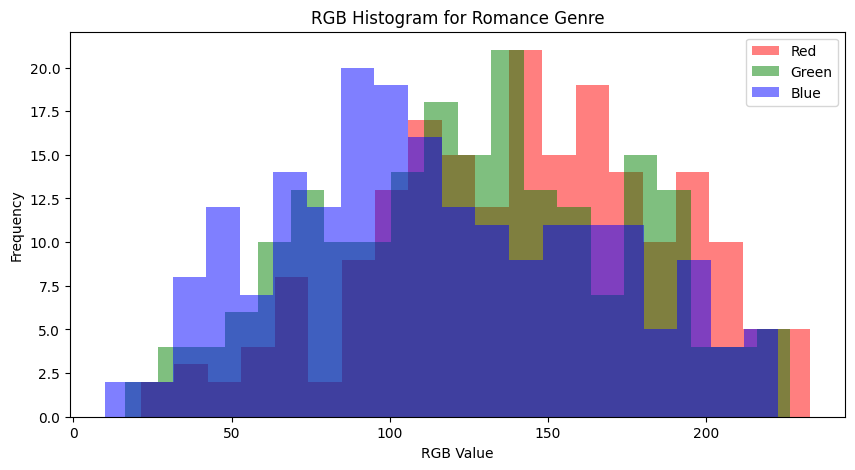

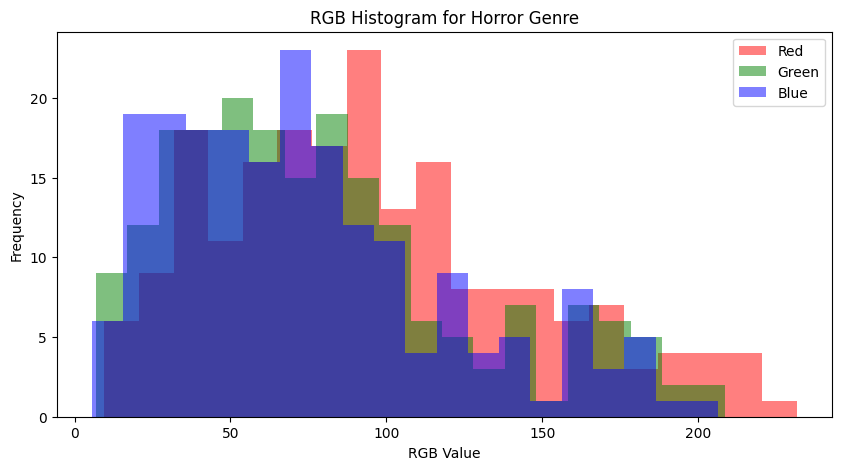

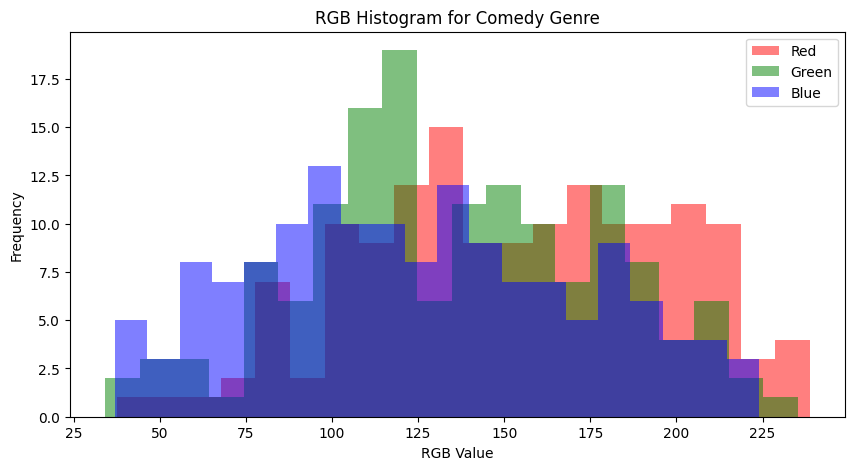

In [41]:
# Plotting a histogram of rgb values for each genre
for genre in df['Genre'].unique():
  genre_df = df[df['Genre'] == genre]
  plt.figure(figsize=(10, 5))
  plt.title(f'RGB Histogram for {genre} Genre')
  plt.hist(genre_df['avg_r'], bins=20, color='red', alpha=0.5, label='Red')
  plt.hist(genre_df['avg_g'], bins=20, color='green', alpha=0.5, label='Green')
  plt.hist(genre_df['avg_b'], bins=20, color='blue', alpha=0.5, label='Blue')
  plt.xlabel('RGB Value')
  plt.ylabel('Frequency')
  plt.legend()
  plt.show()

In [33]:
# Calculating average image brightness and adding to dataframe
def brightness( im_file ):
   im = Image.open(im_file).convert('L')
   stat = ImageStat.Stat(im)
   return stat.mean[0]

brightness_values = []

for i in range(550):
    if i == 444 or i == 496:
      brightness_values.append(np.NaN)
    else:
      image = f'/content/images/image_{i}.jpg'
      pbrightness = brightness(image)
      brightness_values.append(pbrightness)


df["brightness"] = brightness_values

df.head()

,Genre,MoviePoster,Movie Title,brightness
0,Romance,https://m.media-amazon.com/images/M/MV5BYjA4MT...,Malena,131.847930
1,Romance,https://m.media-amazon.com/images/M/MV5BOTNmYz...,Amélie,59.359317
2,Romance,https://m.media-amazon.com/images/M/MV5BYTY3Mm...,A Very Long Engagement,99.831504
3,Romance,https://m.media-amazon.com/images/M/MV5BN2Q4Nj...,In the Mood for Love,64.327985
4,Romance,https://m.media-amazon.com/images/M/MV5BYjIyND...,The Curious Case of Benjamin Button,84.113768


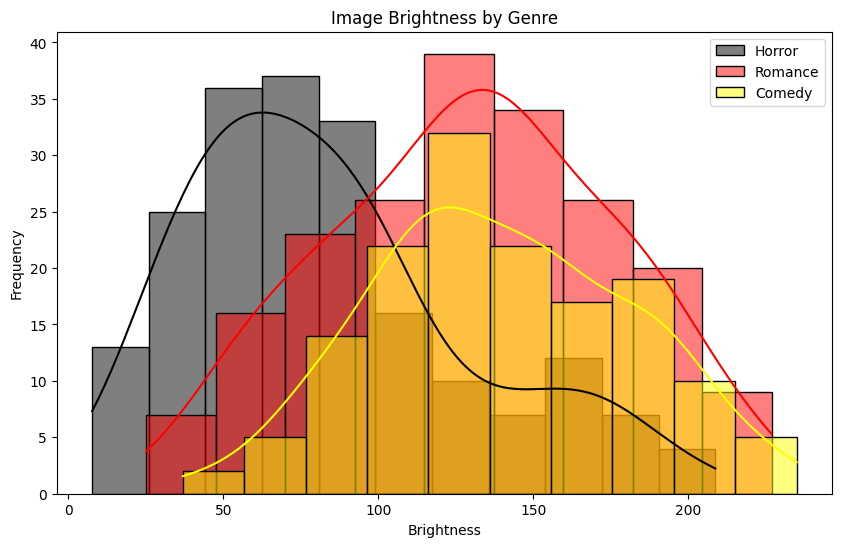

In [34]:
# Plotting a histogram of brightness grouped by genre

plt.figure(figsize=(10, 6))

sns.histplot(df[df['Genre'] == 'Horror']['brightness'], color='black', label='Horror', kde=True)
sns.histplot(df[df['Genre'] == 'Romance']['brightness'], color='red', label='Romance', kde=True)
sns.histplot(df[df['Genre'] == 'Comedy']['brightness'], color='yellow', label='Comedy', kde=True)


plt.xlabel('Brightness')
plt.ylabel('Frequency')
plt.title('Image Brightness by Genre')
plt.legend()
plt.show()